All data is from one continuous EEG measurement with the Emotiv EEG Neuroheadset. The duration of the measurement was 117 seconds. The eye state was detected via a camera during the EEG measurement and added later manually to the file after analysing the video frames. '1' indicates the eye-closed and '0' the eye-open state. All values are in chronological order with the first measured value at the top of the data.

Yellow (AF3, AF4)    → Anterior frontal (attention/executive control)

Red (F7, F3, F4, F8) → Frontal (cognition, emotion, motor planning)

Orange (FC5, FC6)    → Fronto-central (decision-making, motor control)

Light blue (T7, T8)  → Temporal (auditory, memory)

Green (P7, P8)       → Parietal (sensory integration, spatial awareness)

Purple (O1, O2)      → Occipital (visual cortex, eye state detection)

'1' indicates the eye-closed and '0' the eye-open state

<>:2: SyntaxWarning: invalid escape sequence '\c'
<>:2: SyntaxWarning: invalid escape sequence '\c'
C:\Users\DELL\AppData\Local\Temp\ipykernel_24196\1383169711.py:2: SyntaxWarning: invalid escape sequence '\c'
  Image("D:\class\mini_project\images\eeg_electrode.png", width=500)


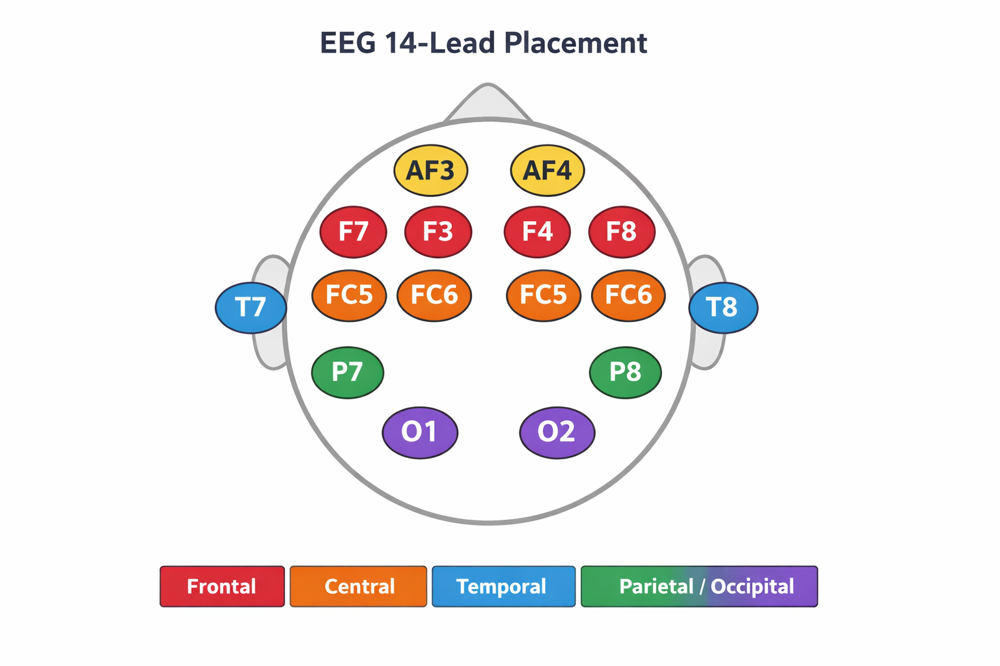

In [3]:
from IPython.display import Image
Image("D:\class\mini_project\images\eeg_electrode.png", width=500)

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import warnings; warnings.filterwarnings('ignore')

In [5]:
eeg_df=pd.read_csv(r'https://archive.ics.uci.edu/static/public/264/data.csv')

# EDA (Visualization) and Pre-processing

In [6]:
eeg_df.head()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4,eyeDetection
0,4329.23,4009.23,4289.23,4148.21,4350.26,4586.15,4096.92,4641.03,4222.05,4238.46,4211.28,4280.51,4635.90,4393.85,0
1,4324.62,4004.62,4293.85,4148.72,4342.05,4586.67,4097.44,4638.97,4210.77,4226.67,4207.69,4279.49,4632.82,4384.10,0
2,4327.69,4006.67,4295.38,4156.41,4336.92,4583.59,4096.92,4630.26,4207.69,4222.05,4206.67,4282.05,4628.72,4389.23,0
3,4328.72,4011.79,4296.41,4155.90,4343.59,4582.56,4097.44,4630.77,4217.44,4235.38,4210.77,4287.69,4632.31,4396.41,0
4,4326.15,4011.79,4292.31,4151.28,4347.69,4586.67,4095.90,4627.69,4210.77,4244.10,4212.82,4288.21,4632.82,4398.46,0


In [7]:
eeg_df.tail()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4,eyeDetection
14975,4281.03,3990.26,4245.64,4116.92,4333.85,4614.36,4074.87,4625.64,4203.08,4221.54,4171.28,4269.23,4593.33,4340.51,1
14976,4276.92,3991.79,4245.13,4110.77,4332.82,4615.38,4073.33,4621.54,4194.36,4217.44,4162.56,4259.49,4590.26,4333.33,1
14977,4277.44,3990.77,4246.67,4113.85,4333.33,4615.38,4072.82,4623.59,4193.33,4212.82,4160.51,4257.95,4591.79,4339.49,1
14978,4284.62,3991.79,4251.28,4122.05,4334.36,4616.41,4080.51,4628.72,4200.00,4220.00,4165.64,4267.18,4596.41,4350.77,1
14979,4287.69,3997.44,4260.00,4121.03,4333.33,4616.41,4088.72,4638.46,4212.31,4226.67,4167.69,4274.36,4597.95,4350.77,1


In [8]:
eeg_df.shape

(14980, 15)

In [9]:
eeg_df.size

224700

In [10]:
eeg_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 14980 entries, 0 to 14979
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   AF3           14980 non-null  float64
 1   F7            14980 non-null  float64
 2   F3            14980 non-null  float64
 3   FC5           14980 non-null  float64
 4   T7            14980 non-null  float64
 5   P7            14980 non-null  float64
 6   O1            14980 non-null  float64
 7   O2            14980 non-null  float64
 8   P8            14980 non-null  float64
 9   T8            14980 non-null  float64
 10  FC6           14980 non-null  float64
 11  F4            14980 non-null  float64
 12  F8            14980 non-null  float64
 13  AF4           14980 non-null  float64
 14  eyeDetection  14980 non-null  int64  
dtypes: float64(14), int64(1)
memory usage: 1.7 MB


In [11]:
eeg_df.duplicated().sum()

np.int64(0)

In [12]:
eeg_df.isnull().sum()

AF3             0
F7              0
F3              0
FC5             0
T7              0
P7              0
O1              0
O2              0
P8              0
T8              0
FC6             0
F4              0
F8              0
AF4             0
eyeDetection    0
dtype: int64

In [13]:
eeg_df.describe()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4,eyeDetection
count,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000,14980.000000
mean,4321.917777,4009.767694,4264.022433,4164.946326,4341.741075,4644.022379,4110.400160,4616.056904,4218.826610,4231.316200,4202.456900,4279.232774,4615.205336,4416.435832,0.448798
std,2492.072174,45.941672,44.428052,5216.404632,34.738821,2924.789537,4600.926543,29.292603,2136.408523,38.050903,37.785981,41.544312,1208.369958,5891.285043,0.497388
min,1030.770000,2830.770000,1040.000000,2453.330000,2089.740000,2768.210000,2086.150000,4567.180000,1357.950000,1816.410000,3273.330000,2257.950000,86.666700,1366.150000,0.000000
25%,4280.510000,3990.770000,4250.260000,4108.210000,4331.790000,4611.790000,4057.950000,4604.620000,4190.770000,4220.510000,4190.260000,4267.690000,4590.770000,4342.050000,0.000000
50%,4294.360000,4005.640000,4262.560000,4120.510000,4338.970000,4617.950000,4070.260000,4613.330000,4199.490000,4229.230000,4200.510000,4276.920000,4603.080000,4354.870000,0.000000
75%,4311.790000,4023.080000,4270.770000,4132.310000,4347.180000,4626.670000,4083.590000,4624.100000,4209.230000,4239.490000,4211.280000,4287.180000,4617.440000,4372.820000,1.000000
max,309231.000000,7804.620000,6880.510000,642564.000000,6474.360000,362564.000000,567179.000000,7264.100000,265641.000000,6674.360000,6823.080000,7002.560000,152308.000000,715897.000000,1.000000


#### From the above analysis, some column has a high range of outliers. Mostly all 75% of the data are fall below the 5000 points. For more analysis, boxplot shows the outlier data point.

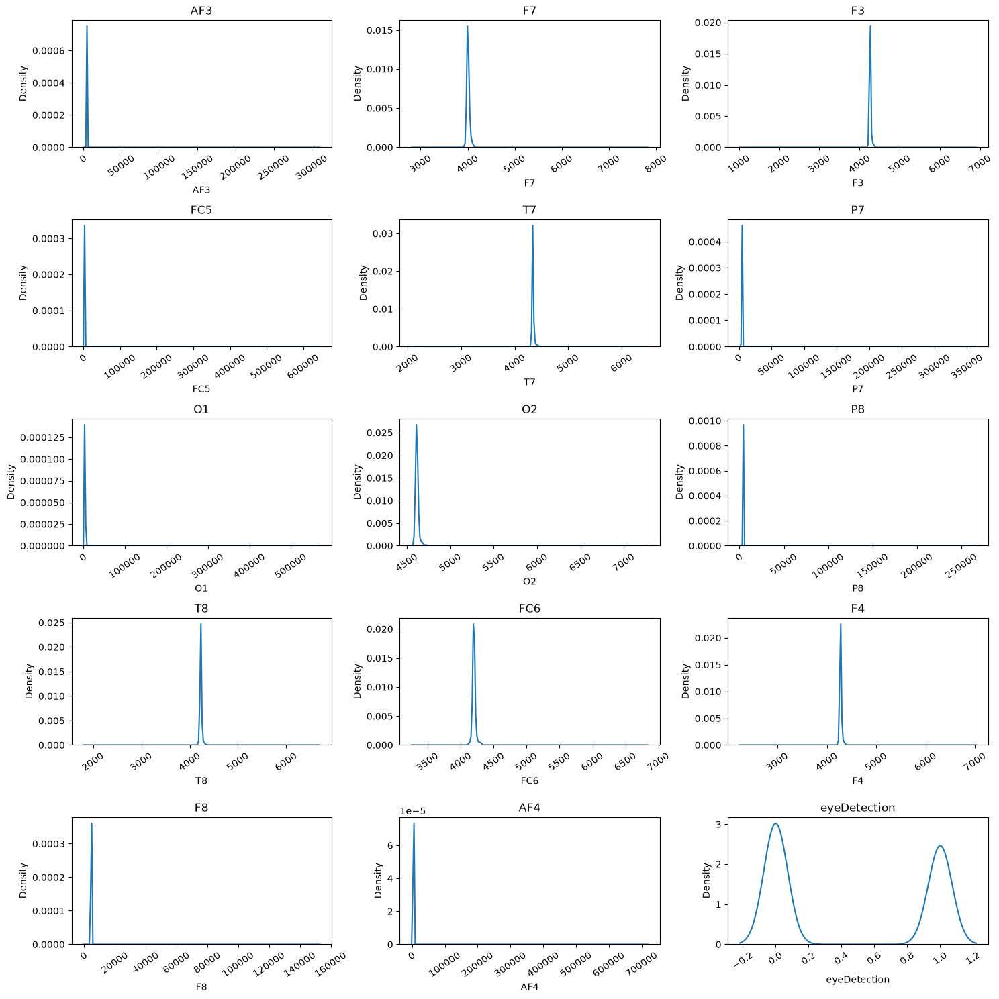

In [14]:
plt.figure(figsize=(15,15))
for i,col in enumerate(eeg_df.columns):
    plt.subplot(5,3,i+1)
    sns.kdeplot(eeg_df[col])
    plt.xticks(rotation=35)
    plt.title(col)

plt.tight_layout()
plt.show()

 #### The KDE plot show the skewness of the data point, which means each features has outliers. For more better viw of outlier, boxplot shows the beter view of outliers and their, min, 25%, 50%, 75%, and max values. Which are useful for the intrepretation of outliers.

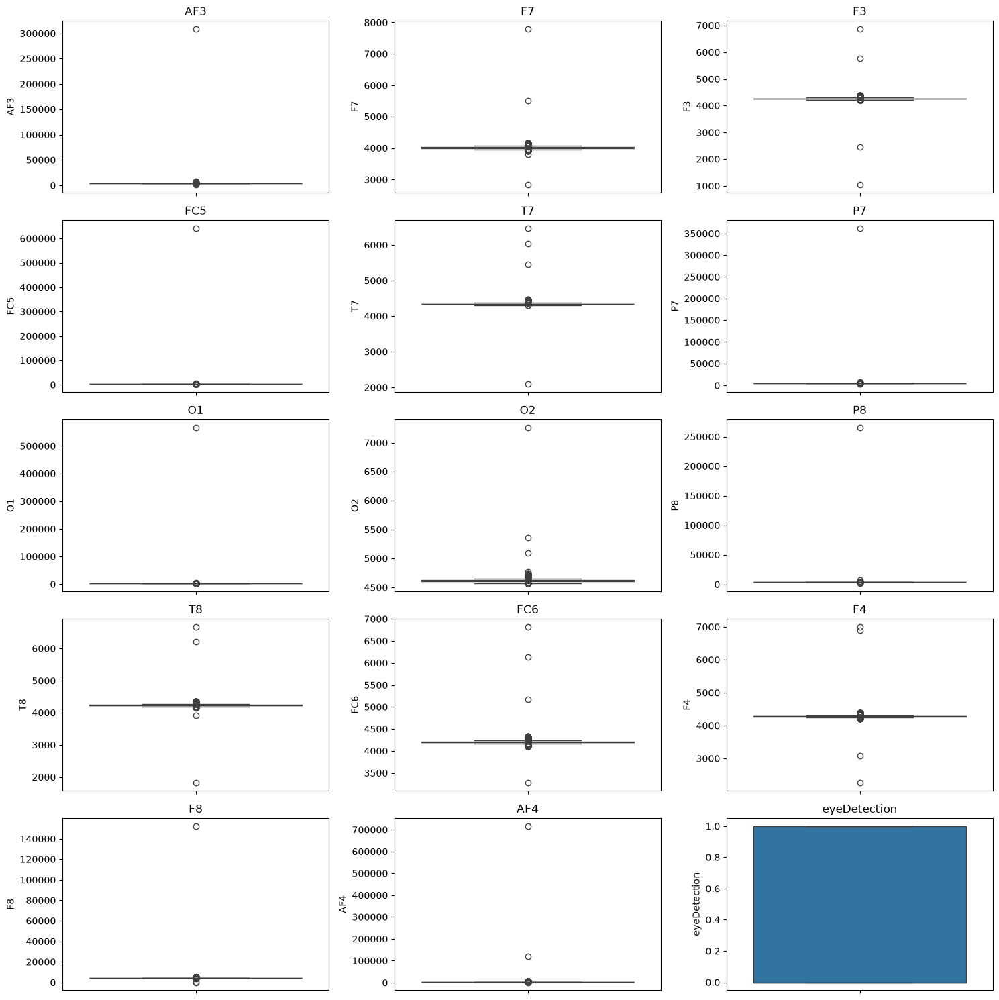

In [15]:
plt.figure(figsize=(15,15))
for i,col in enumerate(eeg_df.columns):
    plt.subplot(5,3,i+1)
    sns.boxplot(eeg_df[col])
    plt.xticks(rotation=35)
    plt.title(col)

plt.tight_layout()
plt.show()

#### Each and every column has outliers. But the number of outliers are small. These outliers or artifacts are created during the procedure of the EEG. These artifacts are arises from many sources like, 1. Powerline Interference, 2. Artifact from the patient by moving their body part during the procedure time. 3. Electrode placement in the scalpe of the patient. These are the some artifacts or noises arised from the EEG and it reflects in the data points.

#### For removing the outlier, I'm going to use IQR technique.

In [16]:
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)   
    Q3 = data[column].quantile(0.75)   
    IQR = Q3 - Q1                      
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    filtered = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return filtered

In [17]:
filtered_df=remove_outliers_iqr(eeg_df, eeg_df.columns)

#### Checking the data, is there any outliers after the the outliers removed

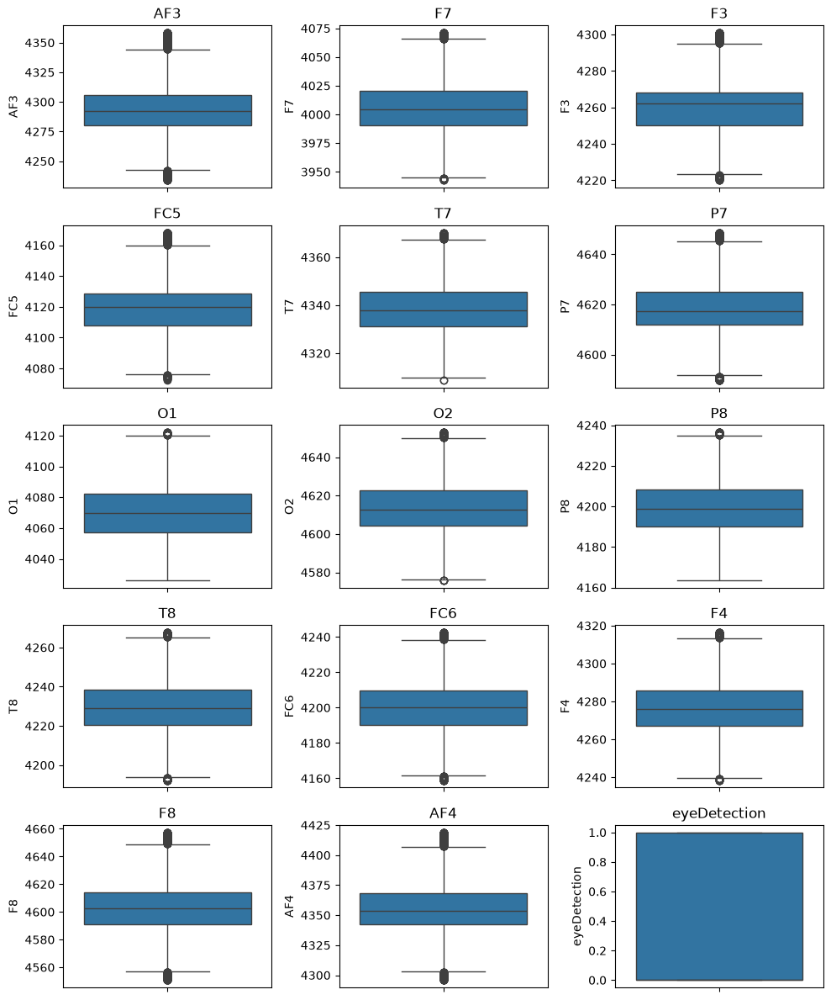

In [18]:
fig, axes= plt.subplots(5,3,figsize=(10,12))

for ax, col in zip(axes.flatten(),filtered_df.columns):
    sns.boxplot(y=filtered_df[col], ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

#### In the above boxplot, the outliers are removed. Now the data has no outliers.

In [19]:
eeg_df.shape, filtered_df.shape

((14980, 15), (14980, 15))

In [20]:
filtered_df.describe()

,AF3,F7,F3,FC5,T7,P7,O1,O2,P8,T8,FC6,F4,F8,AF4,eyeDetection
count,13495.00000,14270.000000,14155.000000,14379.000000,14253.000000,13915.000000,14632.000000,14371.000000,14396.000000,14150.000000,13917.000000,14142.000000,13520.000000,13388.000000,14980.000000
mean,4293.88700,4006.510249,4261.148107,4119.834391,4338.718892,4618.129521,4071.108601,4613.466933,4199.378750,4229.398799,4199.966213,4276.919286,4602.721331,4355.529336,0.448798
std,21.19807,23.593830,14.368003,16.054519,10.414065,10.553449,17.748213,13.583777,13.298313,13.796837,15.980389,14.176159,19.081966,21.508846,0.497388
min,4233.85000,3942.560000,4220.000000,4072.310000,4308.720000,4589.740000,4026.150000,4575.900000,4163.590000,4192.310000,4158.970000,4238.460000,4550.770000,4295.900000,0.000000
25%,4280.51000,3990.260000,4250.260000,4107.690000,4331.280000,4611.790000,4057.440000,4604.100000,4190.260000,4220.510000,4190.260000,4267.180000,4591.280000,4342.050000,0.000000
50%,4292.31000,4004.620000,4262.050000,4120.000000,4337.950000,4617.440000,4069.740000,4612.820000,4198.970000,4229.230000,4200.000000,4275.900000,4602.560000,4353.850000,0.000000
75%,4306.15000,4020.510000,4268.210000,4128.720000,4345.640000,4625.130000,4082.560000,4622.560000,4208.210000,4238.460000,4209.740000,4285.640000,4614.360000,4368.210000,1.000000
max,4358.46000,4071.280000,4301.030000,4168.210000,4370.260000,4648.720000,4122.050000,4652.820000,4236.410000,4267.690000,4242.560000,4316.410000,4657.440000,4418.970000,1.000000


In [21]:
eeg_df.shape, filtered_df.shape

((14980, 15), (14980, 15))

In [22]:
filtered_df.isnull().sum()

AF3             1485
F7               710
F3               825
FC5              601
T7               727
P7              1065
O1               348
O2               609
P8               584
T8               830
FC6             1063
F4               838
F8              1460
AF4             1592
eyeDetection       0
dtype: int64

#### After the removal of outliers, there are some null values present in the dataset. So, I choosed to remove it

In [23]:
filtered_df=filtered_df.dropna()

In [24]:
filtered_df.isnull().sum()

AF3             0
F7              0
F3              0
FC5             0
T7              0
P7              0
O1              0
O2              0
P8              0
T8              0
FC6             0
F4              0
F8              0
AF4             0
eyeDetection    0
dtype: int64

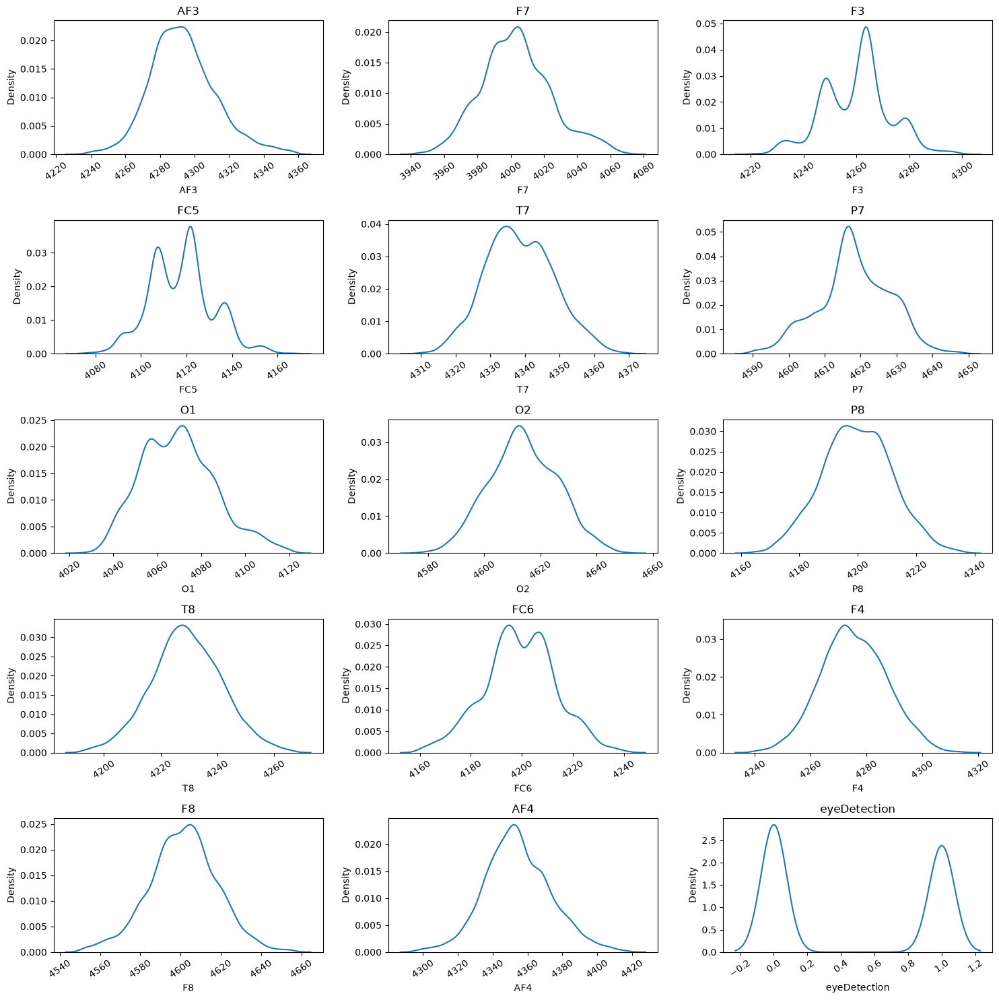

In [25]:
plt.figure(figsize=(15,15))
for i,col in enumerate(filtered_df.columns):
    plt.subplot(5,3,i+1)
    sns.kdeplot(filtered_df[col])
    plt.xticks(rotation=35)
    plt.title(col)

plt.tight_layout()
plt.show()

#### After the outlier removal, all data follows a normal distribution and skewness get reduced.

<Figure size 1000x1000 with 0 Axes>

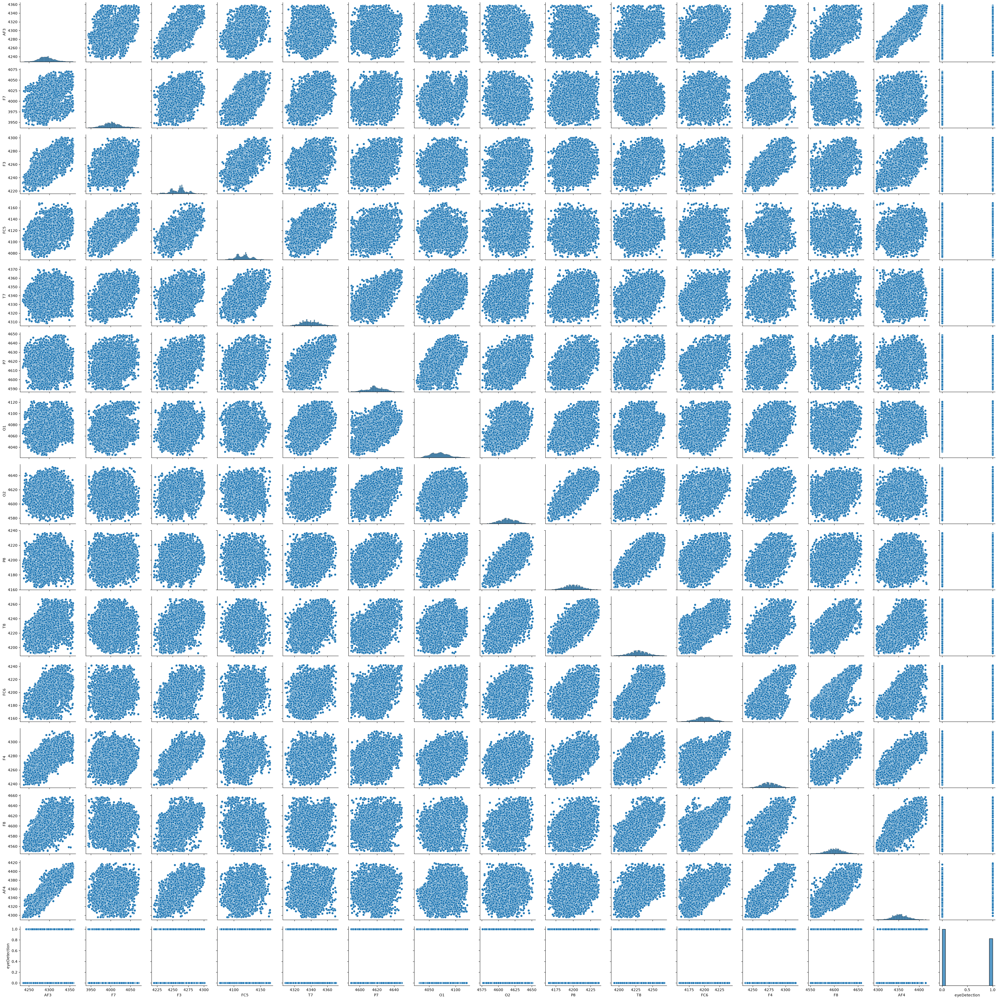

In [26]:
plt.figure(figsize=(10,10))
sns.pairplot(filtered_df, kind='scatter')
plt.tight_layout()
plt.show()

#### From the pairplot, most of the data are spread all over the space and some features shows linear relationship to each other

In [27]:
target_count=eeg_df['eyeDetection'].value_counts()
print(target_count)
print(f' 0 is {(target_count[0]/eeg_df.shape[0]) * 100 :.2f}%')
print(f' 1 is {(target_count[1]/eeg_df.shape[0]) * 100 :.2f}%')

eyeDetection
0    8257
1    6723
Name: count, dtype: int64
 0 is 55.12%
 1 is 44.88%


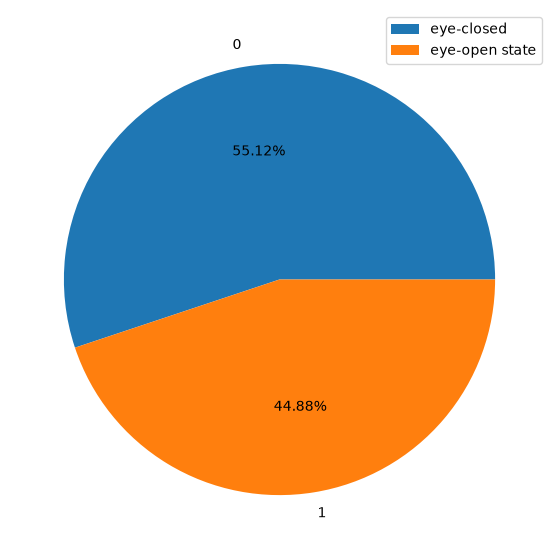

In [28]:
plt.figure(figsize=(7,7))
plt.pie(target_count, autopct='%.2f%%', labels=target_count.index)
plt.legend({'eye-open state','eye-closed' })
plt.show()

#### From the above intrepretation and pie chart 0 is 55.12%, 1 is 44.88%, Target feature's value are balanced. So, there is no need for sampling the data.

# Feature Selection

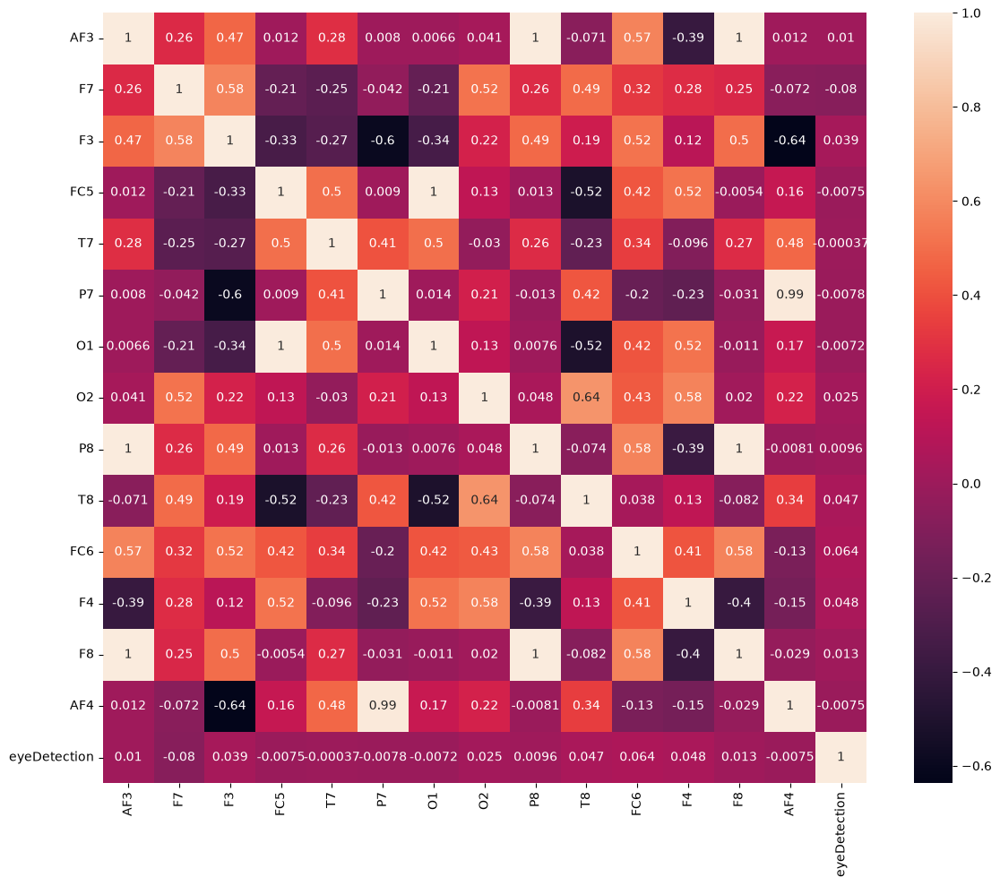

In [29]:
corr=eeg_df.corr()
plt.figure(figsize=(12,10))
sns.heatmap(corr, annot=True)
plt.tight_layout()
plt.show()

#### These columns are highly correleted. So, It is suggested to remove the highly correleted features to avoid multicolinearity(multiple features telling the same story)
O1 ↔ FC5

P8 ↔ AF3

F8 ↔ AF3

F8 ↔ P8

AF4 ↔ P7

#### From the above features: O1, P8, F8, AF4 are going to drop to reduce the multicolinearity and features like, FC5, AF3 and P7 are kept for the model developmant. Most of the indepedent features shows diversity when compared to the target fearutes in correletion heatmap.

In [30]:
filtered_df=filtered_df.drop(columns=['O1','P8','F8','AF4'])

In [31]:
filtered_df.columns

Index(['AF3', 'F7', 'F3', 'FC5', 'T7', 'P7', 'O2', 'T8', 'FC6', 'F4',
       'eyeDetection'],
      dtype='str')

# Train test split

In [32]:
x = filtered_df.drop('eyeDetection', axis=1)
y = filtered_df['eyeDetection']

In [33]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.25, random_state=42)

print(f'shape of x_train: {x_train.shape} and x_test: {x_test.shape}')
print(f'shape of y_train: {y_train.shape} and y_test: {y_test.shape}')

shape of x_train: (8889, 10) and x_test: (2964, 10)
shape of y_train: (8889,) and y_test: (2964,)


# Feature Scaling

In [34]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler. transform(x_test)

print(f'shape of x_train_scaled: {x_train_scaled.shape} and x_test_scaled: {x_test_scaled.shape}')

shape of x_train_scaled: (8889, 10) and x_test_scaled: (2964, 10)


In [35]:
try:
    with open(r'D:\class\mini_project\pickle_files\scaler.pkl', 'wb') as file1:
        pickle.dump(scaler, file1)
except Exception as e:
    print('Error in Dumping scaler', e)

# Model development

In [36]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,precision_score,f1_score,recall_score,confusion_matrix

In [37]:
models={
    'RandomForestClassifier': RandomForestClassifier(),
    'GradientBoostingClassifier' : GradientBoostingClassifier(),
    'LogisticRegression' :LogisticRegression(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'xgboost':XGBClassifier(),
    'SVC':SVC(),
    'KNeighborsClassifier' : KNeighborsClassifier()
}

In [38]:
for name, model in models.items():

    model.fit(x_train_scaled,y_train)

    y_train_pred = model.predict(x_train_scaled)
    y_test_pred  = model.predict(x_test_scaled)

    print(f"Model: {name}")
    print("------- For Train Data -------".center(40))
    print(f"{'Accuracy':<15}: {accuracy_score(y_train, y_train_pred):.4f}")
    print(f"{'Precision':<15}: {precision_score(y_train, y_train_pred):.4f}")
    print(f"{'Recall':<15}: {recall_score(y_train, y_train_pred):.4f}")
    print(f"{'F1 Score':<15}: {f1_score(y_train, y_train_pred):.4f}")


    print("------- For Test Data -------".center(40))
    print(f"{'Accuracy':<15}: {accuracy_score(y_test, y_test_pred):.4f}")
    print(f"{'Precision':<15}: {precision_score(y_test, y_test_pred):.4f}")
    print(f"{'Recall':<15}: {recall_score(y_test, y_test_pred):.4f}")
    print(f"{'F1 Score':<15}: {f1_score(y_test, y_test_pred):.4f}")

    print("*" * 80)

Model: RandomForestClassifier
     ------- For Train Data -------     
Accuracy       : 1.0000
Precision      : 1.0000
Recall         : 1.0000
F1 Score       : 1.0000
     ------- For Test Data -------      
Accuracy       : 0.8667
Precision      : 0.8766
Recall         : 0.8241
F1 Score       : 0.8495
********************************************************************************
Model: GradientBoostingClassifier
     ------- For Train Data -------     
Accuracy       : 0.7909
Precision      : 0.7928
Recall         : 0.7315
F1 Score       : 0.7609
     ------- For Test Data -------      
Accuracy       : 0.7594
Precision      : 0.7597
Recall         : 0.6918
F1 Score       : 0.7242
********************************************************************************
Model: LogisticRegression
     ------- For Train Data -------     
Accuracy       : 0.6835
Precision      : 0.6798
Recall         : 0.5754
F1 Score       : 0.6233
     ------- For Test Data -------      
Accuracy       : 0.674

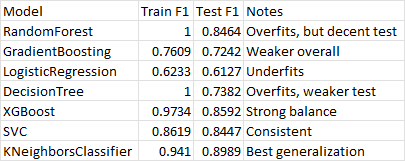

In [39]:
Image("D:\class\mini_project\images\image.png", width=500)

#### From the above model training, XGBoost and KNN performs better. By these 2 model, we are going to analyse them in datailed.

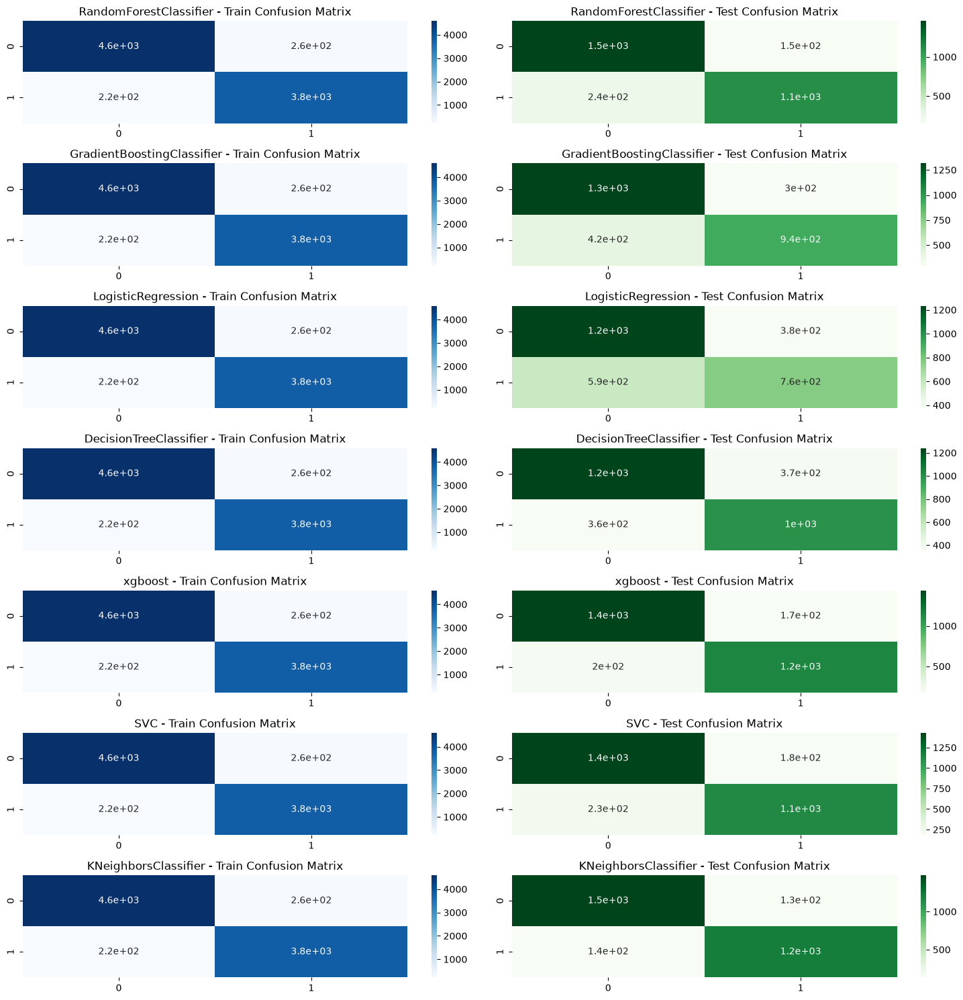

In [40]:
plt.figure(figsize=(15,15))
for i, (name, model) in enumerate(models.items()):
    model.fit(x_train_scaled, y_train)
    y_test_pred = model.predict(x_test_scaled)

    plt.subplot(len(models), 2, 2*i+1)
    train_confusion = confusion_matrix(y_train, y_train_pred)
    sns.heatmap(train_confusion, annot=True, cmap='Blues')
    plt.title(f"{name} - Train Confusion Matrix")

    plt.subplot(len(models), 2, 2*i+2)
    test_confusion = confusion_matrix(y_test, y_test_pred)
    sns.heatmap(test_confusion, annot=True, cmap='Greens')
    plt.title(f"{name} - Test Confusion Matrix")


plt.tight_layout()
plt.show()

In [41]:
speific_models={
    'xgboost':XGBClassifier(),
    'KNeighborsClassifier' : KNeighborsClassifier(),
    'svc' : SVC()
}

In [42]:
for name, model in speific_models.items():

    model.fit(x_train_scaled,y_train)

    y_train_pred = model.predict(x_train_scaled)
    y_test_pred  = model.predict(x_test_scaled)

    precision_pos = precision_score(y_test, y_test_pred, pos_label=1)
    recall_pos    = recall_score(y_test, y_test_pred, pos_label=1)
    f1_pos        = f1_score(y_test, y_test_pred, pos_label=1)
    
    print(f"Model: {name}")
    precision_neg = precision_score(y_test, y_test_pred, pos_label=0)
    recall_neg    = recall_score(y_test, y_test_pred, pos_label=0)
    f1_neg        = f1_score(y_test, y_test_pred, pos_label=0) 

    print(f"Precision (Positive class : 1): {precision_score(y_test, y_test_pred, pos_label=1):.3f}")
    print(f"Recall (Positive class : 1): {recall_score(y_test, y_test_pred, pos_label=1):.3f}")
    print(f"F1 (Positive class : 1): {f1_score(y_test, y_test_pred, pos_label=1):.3f}")
    print()

    print(f"Precision (Negative class : 0): {precision_score(y_test, y_test_pred, pos_label=0):.3f}")
    print(f"Recall (Negative class : 0): {recall_score(y_test, y_test_pred, pos_label=0):.3f}")
    print(f"F1 (Negative class : 0): {f1_score(y_test, y_test_pred, pos_label=0):.3f}")
    print()

Model: xgboost
Precision (Positive class : 1): 0.869
Recall (Positive class : 1): 0.850
F1 (Positive class : 1): 0.859

Precision (Negative class : 0): 0.876
Recall (Negative class : 0): 0.892
F1 (Negative class : 0): 0.884

Model: KNeighborsClassifier
Precision (Positive class : 1): 0.901
Recall (Positive class : 1): 0.897
F1 (Positive class : 1): 0.899

Precision (Negative class : 0): 0.914
Recall (Negative class : 0): 0.917
F1 (Negative class : 0): 0.915

Model: svc
Precision (Positive class : 1): 0.860
Recall (Positive class : 1): 0.830
F1 (Positive class : 1): 0.845

Precision (Negative class : 0): 0.861
Recall (Negative class : 0): 0.886
F1 (Negative class : 0): 0.874



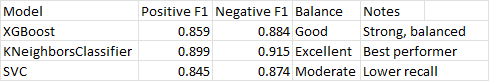

In [44]:
Image("D:\class\mini_project\images\image-1.png", width=500)

#### From the above individual analyses, both the class are analysed using precision, recall and F1 score. By using the score, XGBoost slightly favours for negative class '0' and SVC has the lowest recall for the positive class (0.830), meaning it misses more true positives.. But, KNN make it balance for two class in the comparision. Selecting KNN for hyperparameter tunning.

In [45]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 15],          
    'weights': ['uniform', 'distance'],           
    'p': [1, 2],                                  # distance metric (1=Manhattan, 2=Euclidean)
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  
    'leaf_size': [20, 30, 40, 50],                
    'metric': ['minkowski', 'euclidean', 'manhattan']   
}


knn = KNeighborsClassifier()
grid = GridSearchCV(knn, param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=5)
grid.fit(x_train_scaled, y_train)

print("Best KNN Params:", grid.best_params_)

Fitting 3 folds for each of 1152 candidates, totalling 3456 fits
Best KNN Params: {'algorithm': 'auto', 'leaf_size': 20, 'metric': 'minkowski', 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}


In [46]:
knn_model = KNeighborsClassifier(algorithm ='auto',leaf_size=20,metric='minkowski', n_neighbors = 3, p = 2, weights = 'distance', n_jobs= -1)

knn_model.fit(x_train_scaled, y_train)

y_pred = knn_model.predict(x_test_scaled)

print(f"{'Accuracy':<15}: {accuracy_score(y_test, y_pred):.4f}")
print(f"{'Precision':<15}: {precision_score(y_test, y_pred):.4f}")
print(f"{'Recall':<15}: {recall_score(y_test, y_pred):.4f}")
print(f"{'F1 Score':<15}: {f1_score(y_test, y_pred):.4f}")

Accuracy       : 0.9119
Precision      : 0.9027
Recall         : 0.9047
F1 Score       : 0.9037


     ------- For Test Data -------      
Accuracy       : 0.9079

Precision      : 0.9006

Recall         : 0.8973

F1 Score       : 0.8989

#### By comparing the test data before and after hyperparameter tunning, the tunning help to imporve the accuracy, precision, recall and f1 score. So, the model performs well.

     ------- After Hyperparameter tunning -------

Accuracy       : 0.9119

Precision      : 0.9027

Recall         : 0.9047

F1 Score       : 0.9037

In [47]:
try:
    with open(r'D:\class\mini_project\pickle_files\knn_model.pkl', 'wb') as file2:
        pickle.dump(knn_model, file2)
except Exception as e:
    print('Error in Dumping scaler', e)